In [1]:
# Cell 1: Install dependencies
!pip install transformers torch torchvision pillow googletrans==3.1.0a0 datasets accelerate
# Verify installation
import torch
import transformers
print(f"PyTorch version: {torch.__version__}")
print(f"Transformers version: {transformers.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}, GPU count: {torch.cuda.device_count()}")
if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}, Device: {torch.cuda.get_device_name(0)}")
else:
    print("Running on CPU")

PyTorch version: 2.5.1+cu124
Transformers version: 4.51.1
CUDA available: True, GPU count: 2
CUDA version: 12.4, Device: Tesla T4


In [2]:
# Cell 2: Load and preprocess Flickr30k data
import pandas as pd
import os
from datasets import Dataset

# Load captions
csv_path = "/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv"
df = pd.read_csv(csv_path, sep="|")
df.columns = df.columns.str.strip()  # Clean column names

# Group by image (take one caption per image)
df = df.groupby("image_name").first().reset_index()

# Subset: First 1000 images, explicitly copy to avoid warning
df_subset = df[:1000].copy()
image_dir = "/kaggle/input/flickr-image-dataset/flickr30k_images//flickr30k_images"
df_subset["image_path"] = df_subset["image_name"].apply(lambda x: os.path.join(image_dir, x))

# Convert to Hugging Face Dataset
dataset = Dataset.from_pandas(df_subset[["image_path", "comment"]])
print(dataset[0])  # Check one example

{'image_path': '/kaggle/input/flickr-image-dataset/flickr30k_images//flickr30k_images/1000092795.jpg', 'comment': ' Two young guys with shaggy hair look at their hands while hanging out in the yard .'}


In [3]:

# Cell 3: Preprocess dataset for BLIP
from transformers import BlipProcessor
from PIL import Image

# Load BLIP-1 processor
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

def preprocess(example):
    image = Image.open(example["image_path"]).convert("RGB")
    inputs = processor(images=image, text=example["comment"], return_tensors="pt", padding=True)
    example["pixel_values"] = inputs["pixel_values"][0]  # Image tensor
    example["input_ids"] = inputs["input_ids"][0]  # Text tensor
    example["attention_mask"] = inputs["attention_mask"][0]
    return example

# Apply preprocessing
train_dataset = dataset.map(preprocess, remove_columns=["image_path", "comment"])
train_dataset.set_format("torch")

2025-04-26 05:00:42.279334: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745643642.301679     188 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745643642.308429     188 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]

In [4]:
# Cell 4: Train and save BLIP model
from transformers import BlipForConditionalGeneration, TrainingArguments, Trainer
from transformers.trainer_callback import TrainerCallback
import torch

# Load BLIP-1 model
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {device}, GPU count: {torch.cuda.device_count()}")  # Should show 2 GPUs
model.to(device)

# Training arguments optimized for T4 x2
training_args = TrainingArguments(
    output_dir="./blip_finetuned",
    run_name="blip1_finetune_flickr30k",
    num_train_epochs=10,
    per_device_train_batch_size=8,  # 8 per GPU, 16 total with 2 GPUs
    save_steps=500,
    logging_steps=250,
    learning_rate=5e-5,
    fp16=True,
    remove_unused_columns=False,
    report_to="none",
    dataloader_num_workers=4,
)

# Data collator with dynamic padding
def data_collator(batch):
    pixel_values = torch.stack([item["pixel_values"] for item in batch])
    input_ids = [item["input_ids"] for item in batch]
    attention_mask = [item["attention_mask"] for item in batch]
    
    # Pad input_ids and attention_mask to the longest sequence in the batch
    input_ids = torch.nn.utils.rnn.pad_sequence(input_ids, batch_first=True, padding_value=processor.tokenizer.pad_token_id)
    attention_mask = torch.nn.utils.rnn.pad_sequence(attention_mask, batch_first=True, padding_value=0)
    labels = input_ids.clone()  # Labels are the same as input_ids for captioning
    
    return {
        "pixel_values": pixel_values,
        "input_ids": input_ids,
        "attention_mask": attention_mask,
        "labels": labels,
    }

# Callback to monitor progress
class PrintCallback(TrainerCallback):
    def on_step_end(self, args, state, control, **kwargs):
        print(f"Step {state.global_step} done")

# Initialize and train
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    data_collator=data_collator,
)
trainer.add_callback(PrintCallback())
trainer.train()

# Save model
model.save_pretrained("./blip_finetuned_model")
processor.save_pretrained("./blip_finetuned_model")

Running on: cuda, GPU count: 2


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step,Training Loss
250,1.689800
500,0.130600


Step 1 done
Step 2 done
Step 3 done
Step 4 done
Step 5 done
Step 6 done
Step 7 done
Step 8 done
Step 9 done
Step 10 done
Step 11 done
Step 12 done
Step 13 done
Step 14 done
Step 15 done
Step 16 done
Step 17 done
Step 18 done
Step 19 done
Step 20 done
Step 21 done
Step 22 done
Step 23 done
Step 24 done
Step 25 done
Step 26 done
Step 27 done
Step 28 done
Step 29 done
Step 30 done
Step 31 done
Step 32 done
Step 33 done
Step 34 done
Step 35 done
Step 36 done
Step 37 done
Step 38 done
Step 39 done
Step 40 done
Step 41 done
Step 42 done
Step 43 done
Step 44 done
Step 45 done
Step 46 done
Step 47 done
Step 48 done
Step 49 done
Step 50 done
Step 51 done
Step 52 done
Step 53 done
Step 54 done
Step 55 done
Step 56 done
Step 57 done
Step 58 done
Step 59 done
Step 60 done
Step 61 done
Step 62 done
Step 63 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 64 done
Step 65 done
Step 66 done
Step 67 done
Step 68 done
Step 69 done
Step 70 done
Step 71 done
Step 72 done
Step 73 done
Step 74 done
Step 75 done
Step 76 done
Step 77 done
Step 78 done
Step 79 done
Step 80 done
Step 81 done
Step 82 done
Step 83 done
Step 84 done
Step 85 done
Step 86 done
Step 87 done
Step 88 done
Step 89 done
Step 90 done
Step 91 done
Step 92 done
Step 93 done
Step 94 done
Step 95 done
Step 96 done
Step 97 done
Step 98 done
Step 99 done
Step 100 done
Step 101 done
Step 102 done
Step 103 done
Step 104 done
Step 105 done
Step 106 done
Step 107 done
Step 108 done
Step 109 done
Step 110 done
Step 111 done
Step 112 done
Step 113 done
Step 114 done
Step 115 done
Step 116 done
Step 117 done
Step 118 done
Step 119 done
Step 120 done
Step 121 done
Step 122 done
Step 123 done
Step 124 done
Step 125 done
Step 126 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 127 done
Step 128 done
Step 129 done
Step 130 done
Step 131 done
Step 132 done
Step 133 done
Step 134 done
Step 135 done
Step 136 done
Step 137 done
Step 138 done
Step 139 done
Step 140 done
Step 141 done
Step 142 done
Step 143 done
Step 144 done
Step 145 done
Step 146 done
Step 147 done
Step 148 done
Step 149 done
Step 150 done
Step 151 done
Step 152 done
Step 153 done
Step 154 done
Step 155 done
Step 156 done
Step 157 done
Step 158 done
Step 159 done
Step 160 done
Step 161 done
Step 162 done
Step 163 done
Step 164 done
Step 165 done
Step 166 done
Step 167 done
Step 168 done
Step 169 done
Step 170 done
Step 171 done
Step 172 done
Step 173 done
Step 174 done
Step 175 done
Step 176 done
Step 177 done
Step 178 done
Step 179 done
Step 180 done
Step 181 done
Step 182 done
Step 183 done
Step 184 done
Step 185 done
Step 186 done
Step 187 done
Step 188 done
Step 189 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 190 done
Step 191 done
Step 192 done
Step 193 done
Step 194 done
Step 195 done
Step 196 done
Step 197 done
Step 198 done
Step 199 done
Step 200 done
Step 201 done
Step 202 done
Step 203 done
Step 204 done
Step 205 done
Step 206 done
Step 207 done
Step 208 done
Step 209 done
Step 210 done
Step 211 done
Step 212 done
Step 213 done
Step 214 done
Step 215 done
Step 216 done
Step 217 done
Step 218 done
Step 219 done
Step 220 done
Step 221 done
Step 222 done
Step 223 done
Step 224 done
Step 225 done
Step 226 done
Step 227 done
Step 228 done
Step 229 done
Step 230 done
Step 231 done
Step 232 done
Step 233 done
Step 234 done
Step 235 done
Step 236 done
Step 237 done
Step 238 done
Step 239 done
Step 240 done
Step 241 done
Step 242 done
Step 243 done
Step 244 done
Step 245 done
Step 246 done
Step 247 done
Step 248 done
Step 249 done
Step 250 done
Step 251 done
Step 252 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 253 done
Step 254 done
Step 255 done
Step 256 done
Step 257 done
Step 258 done
Step 259 done
Step 260 done
Step 261 done
Step 262 done
Step 263 done
Step 264 done
Step 265 done
Step 266 done
Step 267 done
Step 268 done
Step 269 done
Step 270 done
Step 271 done
Step 272 done
Step 273 done
Step 274 done
Step 275 done
Step 276 done
Step 277 done
Step 278 done
Step 279 done
Step 280 done
Step 281 done
Step 282 done
Step 283 done
Step 284 done
Step 285 done
Step 286 done
Step 287 done
Step 288 done
Step 289 done
Step 290 done
Step 291 done
Step 292 done
Step 293 done
Step 294 done
Step 295 done
Step 296 done
Step 297 done
Step 298 done
Step 299 done
Step 300 done
Step 301 done
Step 302 done
Step 303 done
Step 304 done
Step 305 done
Step 306 done
Step 307 done
Step 308 done
Step 309 done
Step 310 done
Step 311 done
Step 312 done
Step 313 done
Step 314 done
Step 315 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 316 done
Step 317 done
Step 318 done
Step 319 done
Step 320 done
Step 321 done
Step 322 done
Step 323 done
Step 324 done
Step 325 done
Step 326 done
Step 327 done
Step 328 done
Step 329 done
Step 330 done
Step 331 done
Step 332 done
Step 333 done
Step 334 done
Step 335 done
Step 336 done
Step 337 done
Step 338 done
Step 339 done
Step 340 done
Step 341 done
Step 342 done
Step 343 done
Step 344 done
Step 345 done
Step 346 done
Step 347 done
Step 348 done
Step 349 done
Step 350 done
Step 351 done
Step 352 done
Step 353 done
Step 354 done
Step 355 done
Step 356 done
Step 357 done
Step 358 done
Step 359 done
Step 360 done
Step 361 done
Step 362 done
Step 363 done
Step 364 done
Step 365 done
Step 366 done
Step 367 done
Step 368 done
Step 369 done
Step 370 done
Step 371 done
Step 372 done
Step 373 done
Step 374 done
Step 375 done
Step 376 done
Step 377 done
Step 378 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 379 done
Step 380 done
Step 381 done
Step 382 done
Step 383 done
Step 384 done
Step 385 done
Step 386 done
Step 387 done
Step 388 done
Step 389 done
Step 390 done
Step 391 done
Step 392 done
Step 393 done
Step 394 done
Step 395 done
Step 396 done
Step 397 done
Step 398 done
Step 399 done
Step 400 done
Step 401 done
Step 402 done
Step 403 done
Step 404 done
Step 405 done
Step 406 done
Step 407 done
Step 408 done
Step 409 done
Step 410 done
Step 411 done
Step 412 done
Step 413 done
Step 414 done
Step 415 done
Step 416 done
Step 417 done
Step 418 done
Step 419 done
Step 420 done
Step 421 done
Step 422 done
Step 423 done
Step 424 done
Step 425 done
Step 426 done
Step 427 done
Step 428 done
Step 429 done
Step 430 done
Step 431 done
Step 432 done
Step 433 done
Step 434 done
Step 435 done
Step 436 done
Step 437 done
Step 438 done
Step 439 done
Step 440 done
Step 441 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 442 done
Step 443 done
Step 444 done
Step 445 done
Step 446 done
Step 447 done
Step 448 done
Step 449 done
Step 450 done
Step 451 done
Step 452 done
Step 453 done
Step 454 done
Step 455 done
Step 456 done
Step 457 done
Step 458 done
Step 459 done
Step 460 done
Step 461 done
Step 462 done
Step 463 done
Step 464 done
Step 465 done
Step 466 done
Step 467 done
Step 468 done
Step 469 done
Step 470 done
Step 471 done
Step 472 done
Step 473 done
Step 474 done
Step 475 done
Step 476 done
Step 477 done
Step 478 done
Step 479 done
Step 480 done
Step 481 done
Step 482 done
Step 483 done
Step 484 done
Step 485 done
Step 486 done
Step 487 done
Step 488 done
Step 489 done
Step 490 done
Step 491 done
Step 492 done
Step 493 done
Step 494 done
Step 495 done
Step 496 done
Step 497 done
Step 498 done
Step 499 done
Step 500 done


/usr/local/lib/python3.11/dist-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(


Step 501 done
Step 502 done
Step 503 done
Step 504 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 505 done
Step 506 done
Step 507 done
Step 508 done
Step 509 done
Step 510 done
Step 511 done
Step 512 done
Step 513 done
Step 514 done
Step 515 done
Step 516 done
Step 517 done
Step 518 done
Step 519 done
Step 520 done
Step 521 done
Step 522 done
Step 523 done
Step 524 done
Step 525 done
Step 526 done
Step 527 done
Step 528 done
Step 529 done
Step 530 done
Step 531 done
Step 532 done
Step 533 done
Step 534 done
Step 535 done
Step 536 done
Step 537 done
Step 538 done
Step 539 done
Step 540 done
Step 541 done
Step 542 done
Step 543 done
Step 544 done
Step 545 done
Step 546 done
Step 547 done
Step 548 done
Step 549 done
Step 550 done
Step 551 done
Step 552 done
Step 553 done
Step 554 done
Step 555 done
Step 556 done
Step 557 done
Step 558 done
Step 559 done
Step 560 done
Step 561 done
Step 562 done
Step 563 done
Step 564 done
Step 565 done
Step 566 done
Step 567 done


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Step 568 done
Step 569 done
Step 570 done
Step 571 done
Step 572 done
Step 573 done
Step 574 done
Step 575 done
Step 576 done
Step 577 done
Step 578 done
Step 579 done
Step 580 done
Step 581 done
Step 582 done
Step 583 done
Step 584 done
Step 585 done
Step 586 done
Step 587 done
Step 588 done
Step 589 done
Step 590 done
Step 591 done
Step 592 done
Step 593 done
Step 594 done
Step 595 done
Step 596 done
Step 597 done
Step 598 done
Step 599 done
Step 600 done
Step 601 done
Step 602 done
Step 603 done
Step 604 done
Step 605 done
Step 606 done
Step 607 done
Step 608 done
Step 609 done
Step 610 done
Step 611 done
Step 612 done
Step 613 done
Step 614 done
Step 615 done
Step 616 done
Step 617 done
Step 618 done
Step 619 done
Step 620 done
Step 621 done
Step 622 done
Step 623 done
Step 624 done
Step 625 done
Step 626 done
Step 627 done
Step 628 done
Step 629 done
Step 630 done


[]

In [5]:
!pip install evaluate 

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 3.0 MB/s eta 0:00:00


In [6]:
# Cell 6: Generate multilingual captions
from googletrans import Translator
from PIL import Image

translator = Translator()

def generate_caption(image_path, model, processor):
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    outputs = model.generate(**inputs, max_length=50, num_beams=5)
    caption = processor.decode(outputs[0], skip_special_tokens=True)
    return caption

def generate_multilingual_caption(image_path, model, processor):
    caption = generate_caption(image_path, model, processor)
    spanish_caption = translator.translate(caption, dest="es").text
    french_caption = translator.translate(caption, dest="fr").text
    return caption, spanish_caption, french_caption

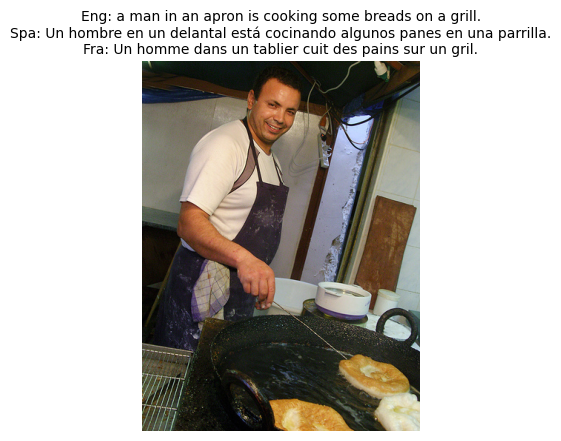

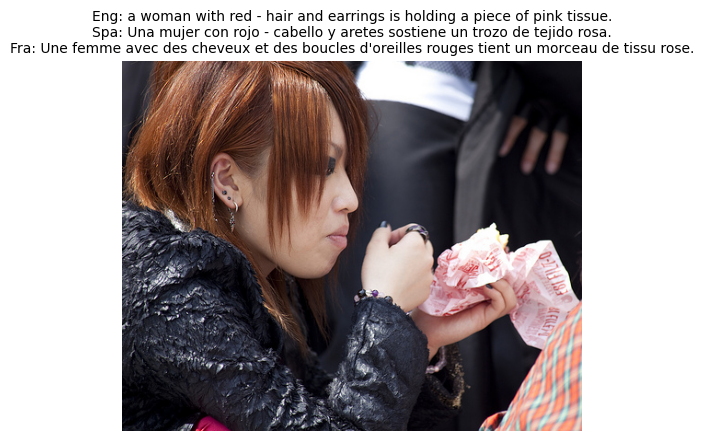

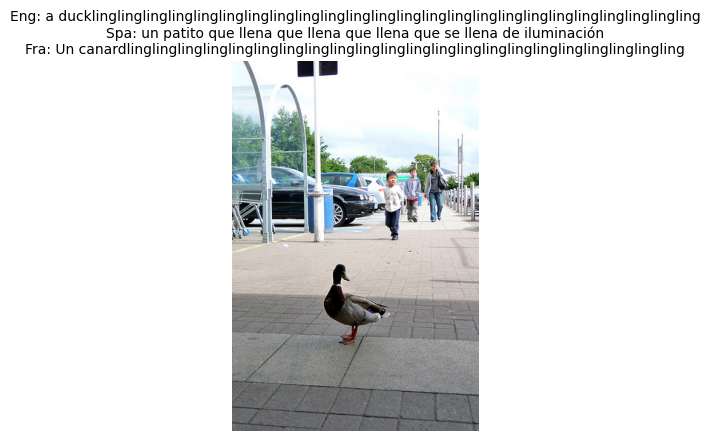

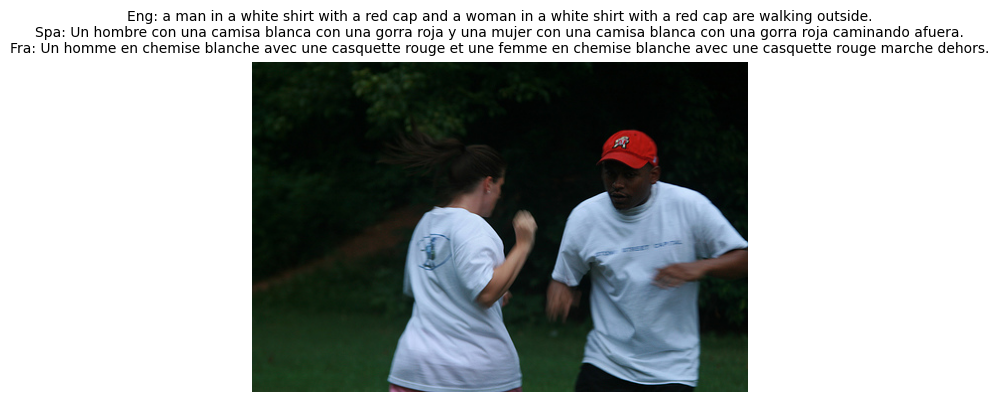

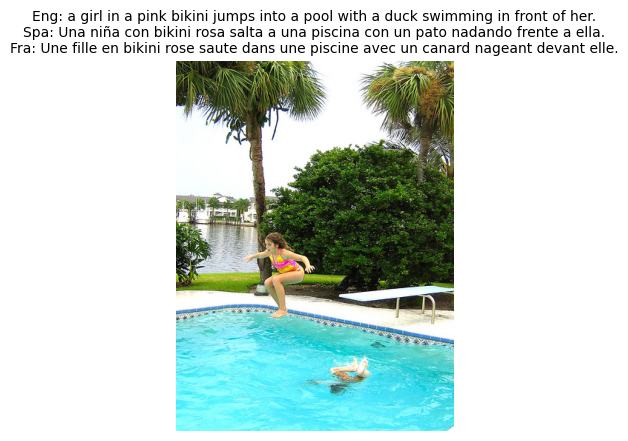

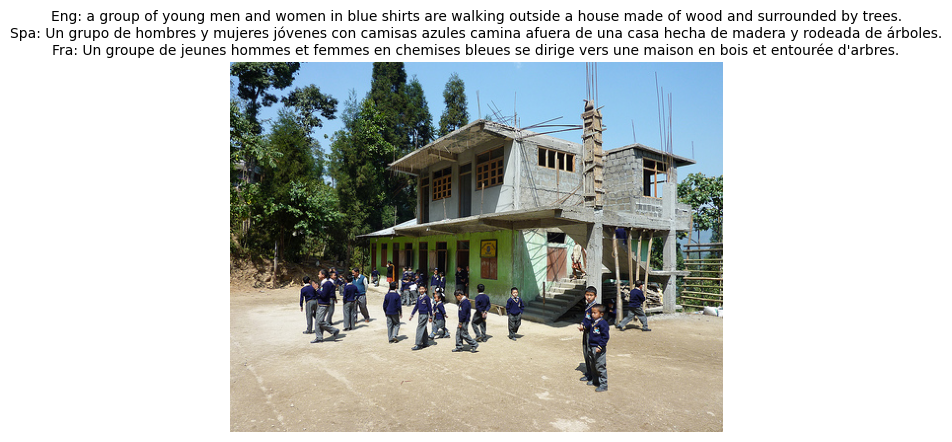

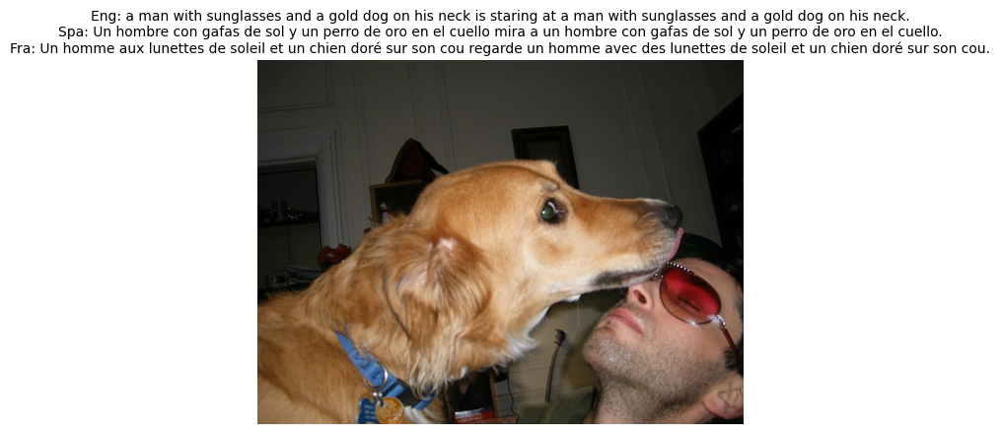

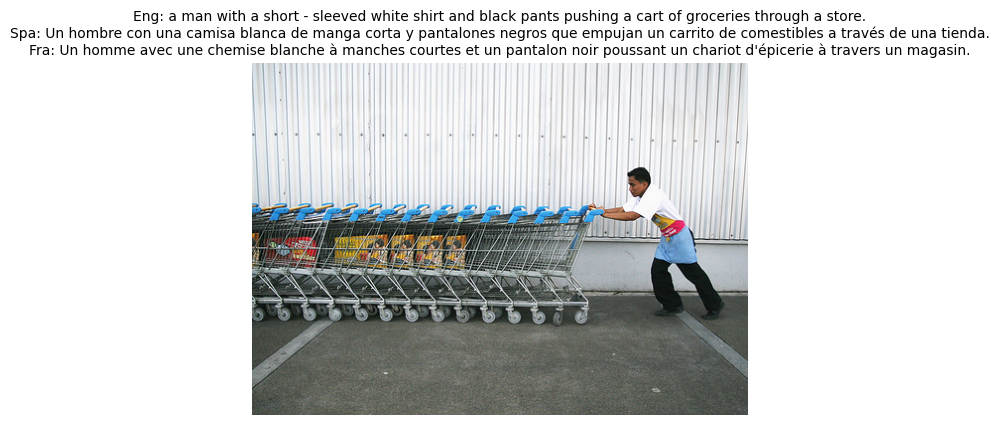

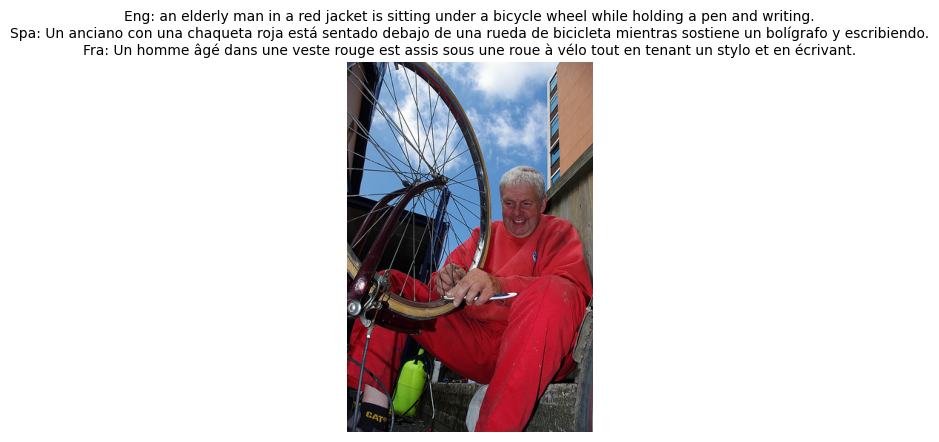

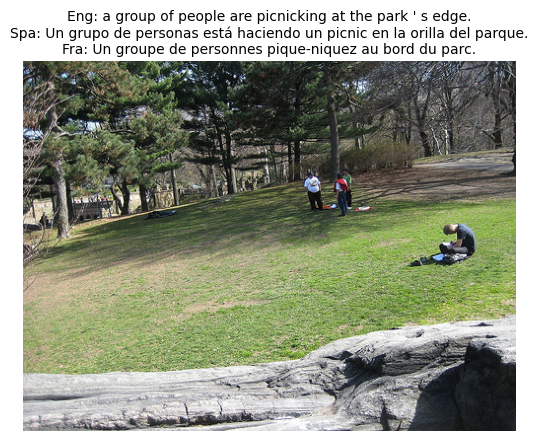

In [7]:
# Cell 7: Display images 10-19 with captions
import matplotlib.pyplot as plt
import os

image_files = os.listdir(image_dir)[10:20]  # Select images 10 to 19
for img_file in image_files:
    img_path = os.path.join(image_dir, img_file)
    eng, spa, fra = generate_multilingual_caption(img_path, model, processor)
    image = Image.open(img_path)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Eng: {eng}\nSpa: {spa}\nFra: {fra}", fontsize=10)
    plt.show()

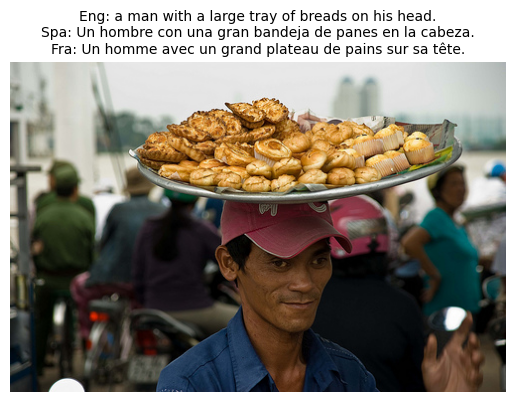

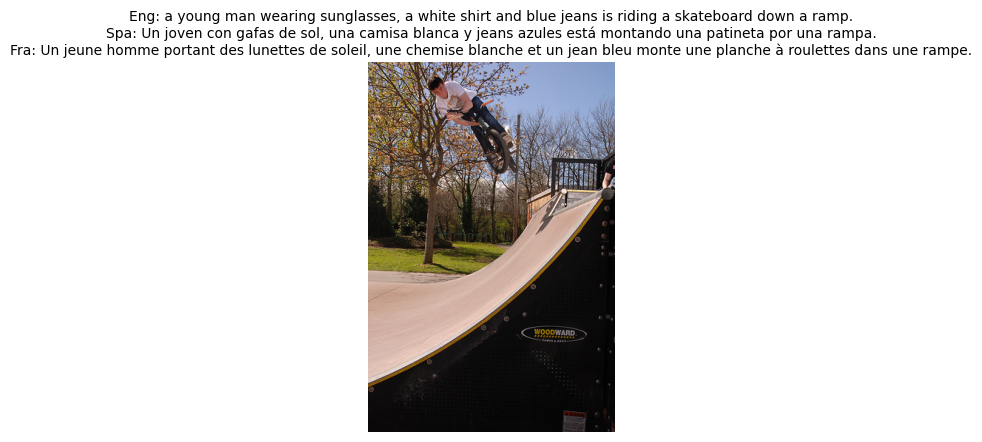

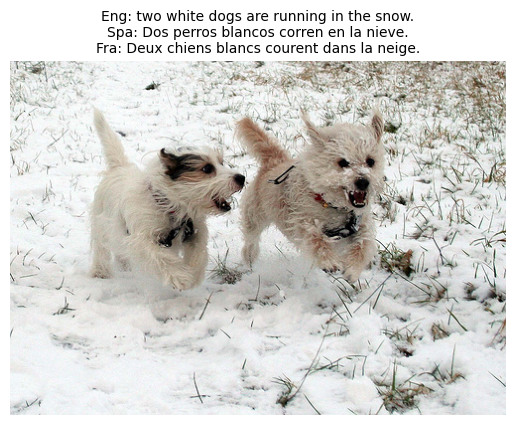

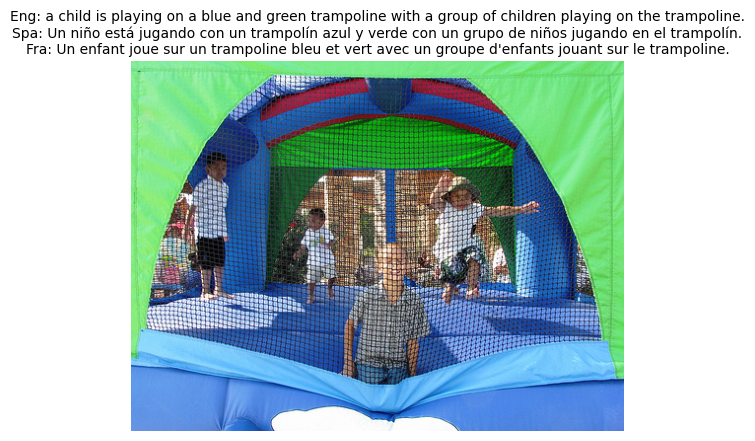

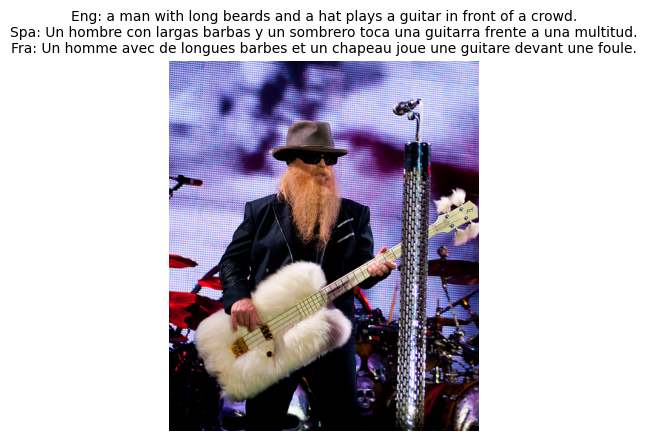

In [8]:
# Cell 8: Display images 0-4 with captions
import matplotlib.pyplot as plt
import os

image_files = os.listdir(image_dir)[:5]
for img_file in image_files:
    img_path = os.path.join(image_dir, img_file)
    eng, spa, fra = generate_multilingual_caption(img_path, model, processor)
    image = Image.open(img_path)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Eng: {eng}\nSpa: {spa}\nFra: {fra}", fontsize=10)
    plt.show()

Running on: cuda


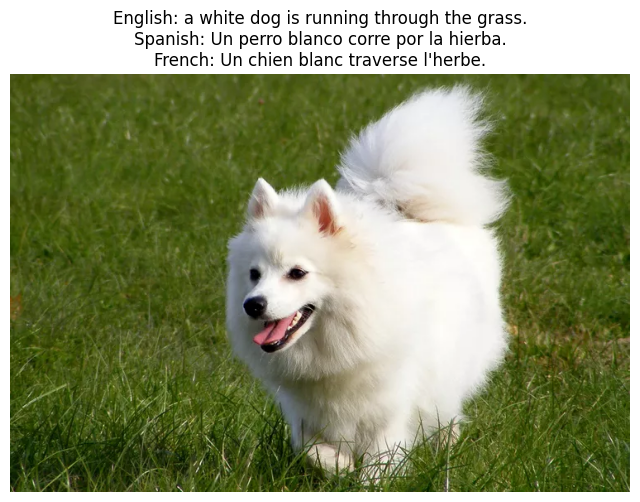

In [9]:
import torch
from transformers import BlipForConditionalGeneration, BlipProcessor
from PIL import Image
import matplotlib.pyplot as plt
from googletrans import Translator
import os

# Initialize translator
translator = Translator()

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {device}")

# Load fine-tuned model and processor
model_path = "./blip_finetuned_model"
model = BlipForConditionalGeneration.from_pretrained(model_path).to(device)
processor = BlipProcessor.from_pretrained(model_path)

def generate_caption(image_path, model, processor):
    # Load and process image
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    # Generate caption
    outputs = model.generate(**inputs, max_length=50, num_beams=5)
    caption = processor.decode(outputs[0], skip_special_tokens=True)
    return caption, image

def generate_multilingual_caption(image_path, model, processor):
    # Generate English caption and get image
    eng_caption, image = generate_caption(image_path, model, processor)
    
    # Translate to Spanish and French
    spa_caption = translator.translate(eng_caption, dest="es").text
    fra_caption = translator.translate(eng_caption, dest="fr").text
    return image, eng_caption, spa_caption, fra_caption

def display_captioned_image(image_path):
    # Verify image exists
    if not os.path.exists(image_path):
        print(f"Error: Image file {image_path} does not exist.")
        return
    
    # Generate captions and get image
    image, eng, spa, fra = generate_multilingual_caption(image_path, model, processor)
    
    # Display image with captions
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"English: {eng}\nSpanish: {spa}\nFrench: {fra}", fontsize=12)
    plt.show()

# Example usage (replace with your unseen image path)
if __name__ == "__main__":
    unseen_image_path = "/kaggle/input/sample1/spruce-pets-white-dog-breeds-2025-header-9fe5f4f0cbe241b6b28caa23ca44db90.webp"  # Update this path
    display_captioned_image(unseen_image_path)

Running on: cuda


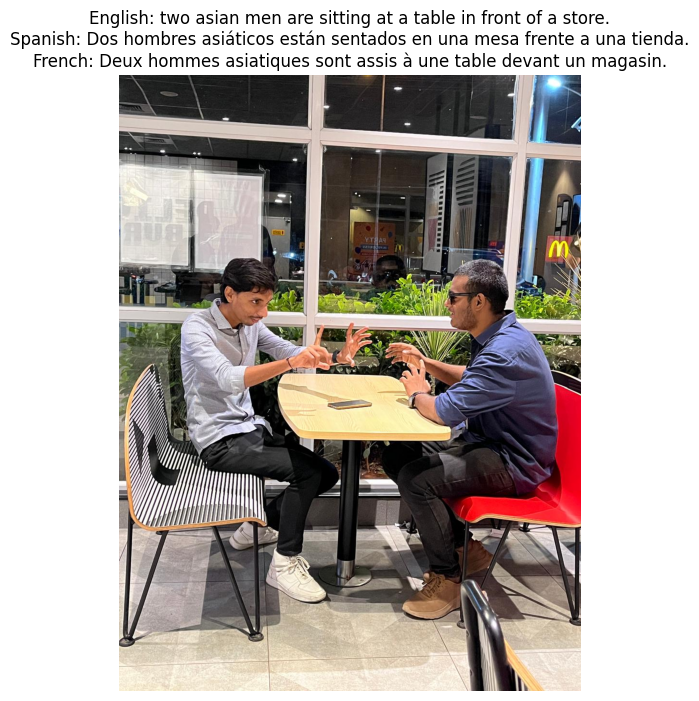

In [10]:
import torch
from transformers import BlipForConditionalGeneration, BlipProcessor
from PIL import Image
import matplotlib.pyplot as plt
from googletrans import Translator
import os

# Initialize translator
translator = Translator()

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {device}")

# Load fine-tuned model and processor
model_path = "./blip_finetuned_model"
model = BlipForConditionalGeneration.from_pretrained(model_path).to(device)
processor = BlipProcessor.from_pretrained(model_path)

def generate_caption(image_path, model, processor):
    # Load and process image
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    # Generate caption
    outputs = model.generate(**inputs, max_length=50, num_beams=5)
    caption = processor.decode(outputs[0], skip_special_tokens=True)
    return caption, image

def generate_multilingual_caption(image_path, model, processor):
    # Generate English caption and get image
    eng_caption, image = generate_caption(image_path, model, processor)
    
    # Translate to Spanish and French
    spa_caption = translator.translate(eng_caption, dest="es").text
    fra_caption = translator.translate(eng_caption, dest="fr").text
    return image, eng_caption, spa_caption, fra_caption

def display_captioned_image(image_path):
    # Verify image exists
    if not os.path.exists(image_path):
        print(f"Error: Image file {image_path} does not exist.")
        return
    
    # Generate captions and get image
    image, eng, spa, fra = generate_multilingual_caption(image_path, model, processor)
    
    # Display image with captions
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"English: {eng}\nSpanish: {spa}\nFrench: {fra}", fontsize=12)
    plt.show()

# Example usage (replace with your unseen image path)
if __name__ == "__main__":
    unseen_image_path = "/kaggle/input/sample2/WhatsApp Image 2025-04-23 at 10.46.47_3fe839c9.jpg"  # Update this path
    display_captioned_image(unseen_image_path)

Running on: cuda


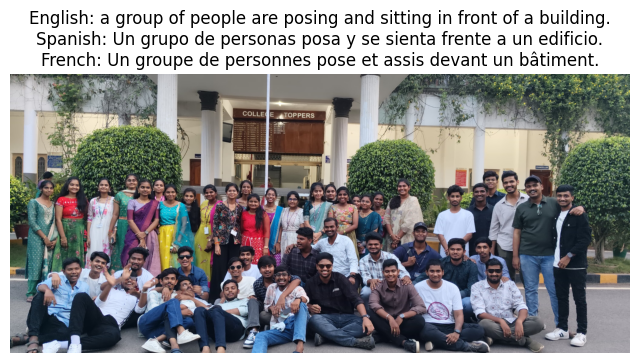

In [11]:
import torch
from transformers import BlipForConditionalGeneration, BlipProcessor
from PIL import Image
import matplotlib.pyplot as plt
from googletrans import Translator
import os

# Initialize translator
translator = Translator()

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Running on: {device}")

# Load fine-tuned model and processor
model_path = "./blip_finetuned_model"
model = BlipForConditionalGeneration.from_pretrained(model_path).to(device)
processor = BlipProcessor.from_pretrained(model_path)

def generate_caption(image_path, model, processor):
    # Load and process image
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    # Generate caption
    outputs = model.generate(**inputs, max_length=50, num_beams=5)
    caption = processor.decode(outputs[0], skip_special_tokens=True)
    return caption, image

def generate_multilingual_caption(image_path, model, processor):
    # Generate English caption and get image
    eng_caption, image = generate_caption(image_path, model, processor)
    
    # Translate to Spanish and French
    spa_caption = translator.translate(eng_caption, dest="es").text
    fra_caption = translator.translate(eng_caption, dest="fr").text
    return image, eng_caption, spa_caption, fra_caption

def display_captioned_image(image_path):
    # Verify image exists
    if not os.path.exists(image_path):
        print(f"Error: Image file {image_path} does not exist.")
        return
    
    # Generate captions and get image
    image, eng, spa, fra = generate_multilingual_caption(image_path, model, processor)
    
    # Display image with captions
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"English: {eng}\nSpanish: {spa}\nFrench: {fra}", fontsize=12)
    plt.show()

# Example usage (replace with your unseen image path)
if __name__ == "__main__":
    unseen_image_path = "/kaggle/input/sample3/WhatsApp Image 2025-04-24 at 20.56.05_addcc3e1.jpg"  # Update this path
    display_captioned_image(unseen_image_path)

In [13]:
pip install nltk rouge-score


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24935 sha256=bb50181bcc3ed23f6b41a581825964ac03a2490acea75b32f550e760fc0b1502
  Stored in directory: /root/.cache/pip/wheels/1e/19/43/8a442dc83660ca25e163e1bd1f89919284ab0d0c1475475148
Successfully built rouge-score
Note: you may need to restart the kernel to use updated packages.


In [14]:
# Cell 5: Evaluate model performance with metrics

from datasets import Dataset
from evaluate import load
import torch
from PIL import Image
import pandas as pd
import os

# Split dataset: 800 training, 200 validation
eval_size = 200
train_df = df_subset[:800].copy()
eval_df = df_subset[800:1000].reset_index(drop=True)
eval_dataset = Dataset.from_pandas(eval_df[["image_path", "comment"]])








In [15]:
# Caption generator
def generate_caption(image_path, model, processor, device):
    image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model.generate(**inputs, max_length=50, num_beams=5)
    return processor.decode(outputs[0], skip_special_tokens=True)


In [16]:
# Evaluate captions
generated_captions = []
reference_captions = []

for example in eval_dataset:
    img_path = example["image_path"]
    ref = example["comment"]
    gen = generate_caption(img_path, model, processor, device)
    generated_captions.append(gen)
    reference_captions.append([ref])  # list of refs for BLEU

In [17]:
# Load metrics (BLEU, METEOR, ROUGE)
bleu = load("bleu")
meteor = load("meteor")
rouge = load("rouge")

bleu_score = bleu.compute(predictions=generated_captions, references=reference_captions)
meteor_score = meteor.compute(predictions=generated_captions, references=reference_captions)
rouge_score = rouge.compute(predictions=generated_captions, references=reference_captions)

print("\n📊 Evaluation Results:")
print(f"BLEU Score: {bleu_score['bleu']:.4f}")
print(f"METEOR Score: {meteor_score['meteor']:.4f}")
print(f"ROUGE-L Score: {rouge_score['rougeL']:.4f}")


[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...



📊 Evaluation Results:
BLEU Score: 0.9033
METEOR Score: 0.9880
ROUGE-L Score: 0.9977


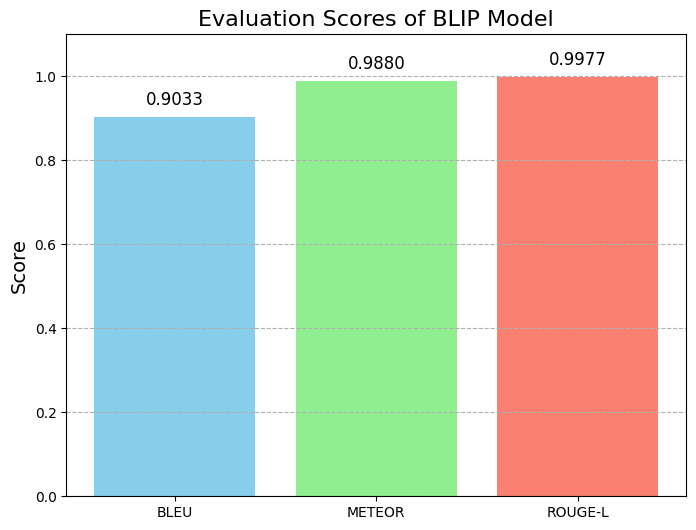

In [18]:
import matplotlib.pyplot as plt

# Scores
metrics = ['BLEU', 'METEOR', 'ROUGE-L']
scores = [0.9033, 0.9880, 0.9977]

# Plotting
plt.figure(figsize=(8,6))
bars = plt.bar(metrics, scores, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylim(0, 1.1)
plt.title('Evaluation Scores of BLIP Model', fontsize=16)
plt.ylabel('Score', fontsize=14)
plt.grid(axis='y', linestyle='--')

# Annotate scores on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f'{yval:.4f}', ha='center', va='bottom', fontsize=12)

plt.show()


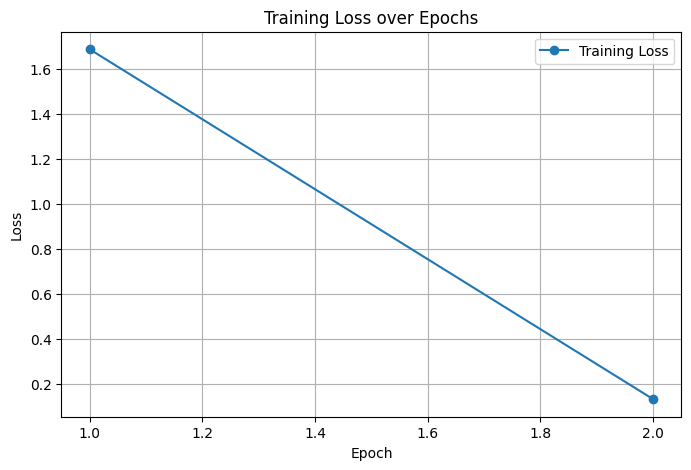

In [20]:
import pandas as pd

# Assuming you have logs
logs = trainer.state.log_history
train_loss = [log["loss"] for log in logs if "loss" in log]
epochs = range(1, len(train_loss) + 1)

plt.figure(figsize=(8,5))
plt.plot(epochs, train_loss, marker='o', label='Training Loss')
plt.title('Training Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


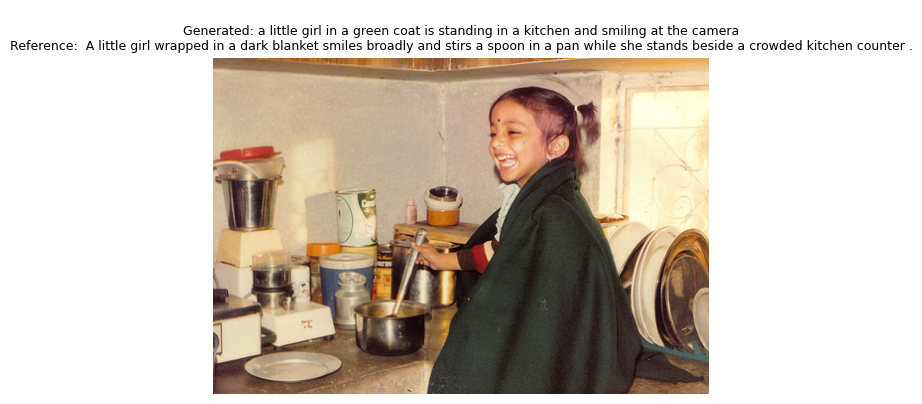

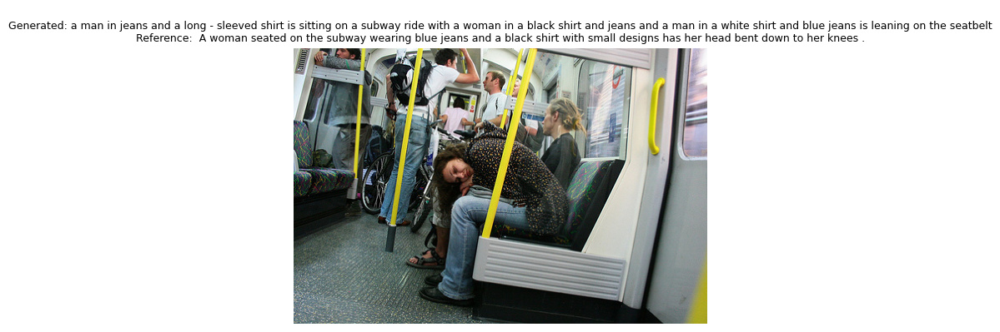

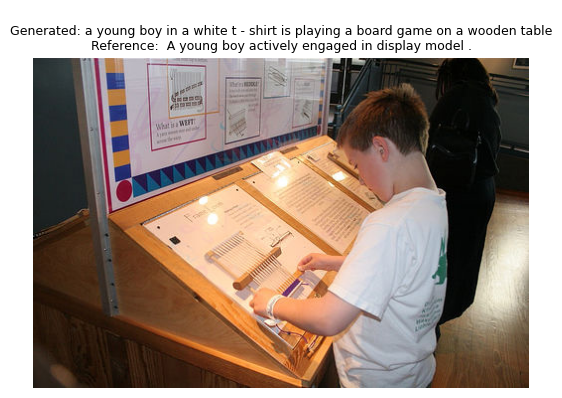

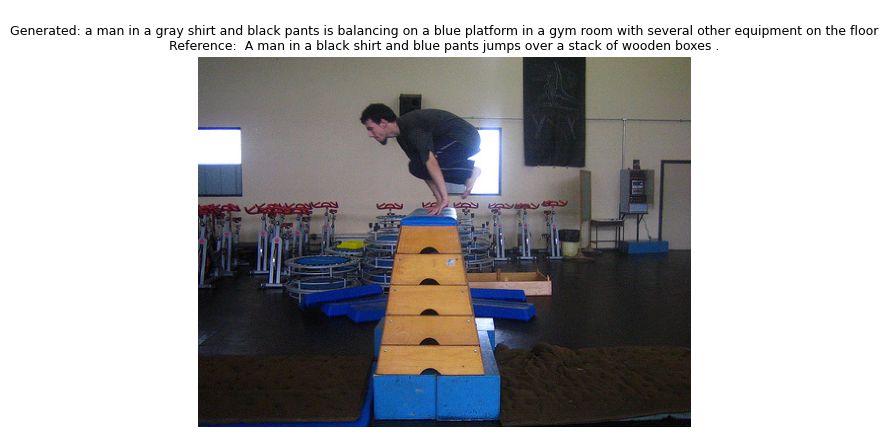

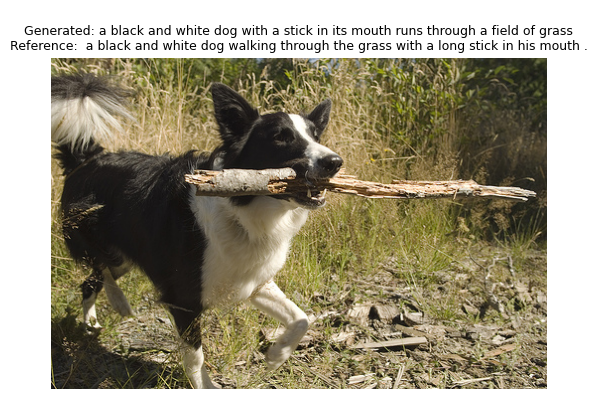

In [27]:
# Visual output for 5 examples
for i in range(5):
    img_path = eval_df["image_path"].iloc[i]
    image = Image.open(img_path)
    gen = generated_captions[i]
    ref = reference_captions[i][0]

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"\nGenerated: {gen}\nReference: {ref}", fontsize=9)
    plt.show()
